In [ ]:
# from torch.utils.data import Dataset 
# from PIL import Image
# import numpy as np
# import os 
# import torchvision.transforms as transforms

# from datasets import concatenate_datasets, load_dataset


In [ ]:
# !pip install -q git+https://github.com/huggingface/transformers.git

In [ ]:
# # !pip install -q datasets
# # from torch.utils.data import Dataset 
# from PIL import Image
# import numpy as np
# import os 
# import torchvision.transforms as transforms
# from datasets import load_dataset

In [134]:
import torch
import random

In [14]:
from torch.utils.data import Dataset 
from datasets import load_dataset
from PIL import Image
import numpy as np
import os 

In [15]:
dataset = load_dataset("chloechia/correctloveda")
train_image = load_dataset("chloechia/correctloveda", split="train")
validation_image = load_dataset("chloechia/correctloveda", split="validation")

Found cached dataset imagefolder (/home/chia/.cache/huggingface/datasets/chloechia___imagefolder/chloechia--correctloveda-701d9bc57e72e64b/0.0.0/37fbb85cc714a338bea574ac6c7d0b5be5aff46c1862c1989b20e0771199e93f)
100%|██████████| 2/2 [00:00<00:00, 15.69it/s]
Found cached dataset imagefolder (/home/chia/.cache/huggingface/datasets/chloechia___imagefolder/chloechia--correctloveda-701d9bc57e72e64b/0.0.0/37fbb85cc714a338bea574ac6c7d0b5be5aff46c1862c1989b20e0771199e93f)
Found cached dataset imagefolder (/home/chia/.cache/huggingface/datasets/chloechia___imagefolder/chloechia--correctloveda-701d9bc57e72e64b/0.0.0/37fbb85cc714a338bea574ac6c7d0b5be5aff46c1862c1989b20e0771199e93f)


In [16]:
mask_dataset = load_dataset("chloechia/maskloveda")

Found cached dataset imagefolder (/home/chia/.cache/huggingface/datasets/chloechia___imagefolder/chloechia--maskloveda-30d1338528c17a6a/0.0.0/37fbb85cc714a338bea574ac6c7d0b5be5aff46c1862c1989b20e0771199e93f)
100%|██████████| 2/2 [00:00<00:00, 52.25it/s]


In [17]:
train_image = train_image.remove_columns("label")
validation_image = validation_image.remove_columns("label")
train_mask_dataset = load_dataset("chloechia/maskloveda", split="train")
train_mask_dataset = train_mask_dataset.remove_columns("label")
val_mask_dataset = load_dataset("chloechia/maskloveda", split="validation")
# val_mask_dataset = val_mask_dataset.remove_columns("label")

Found cached dataset imagefolder (/home/chia/.cache/huggingface/datasets/chloechia___imagefolder/chloechia--maskloveda-30d1338528c17a6a/0.0.0/37fbb85cc714a338bea574ac6c7d0b5be5aff46c1862c1989b20e0771199e93f)
Found cached dataset imagefolder (/home/chia/.cache/huggingface/datasets/chloechia___imagefolder/chloechia--maskloveda-30d1338528c17a6a/0.0.0/37fbb85cc714a338bea574ac6c7d0b5be5aff46c1862c1989b20e0771199e93f)


In [18]:
val_mask_dataset = load_dataset("chloechia/maskloveda", split="validation")
val_mask_dataset = val_mask_dataset.remove_columns("label")
val_mask_dataset = val_mask_dataset.rename_column("image", "mask")

Found cached dataset imagefolder (/home/chia/.cache/huggingface/datasets/chloechia___imagefolder/chloechia--maskloveda-30d1338528c17a6a/0.0.0/37fbb85cc714a338bea574ac6c7d0b5be5aff46c1862c1989b20e0771199e93f)


In [19]:
train_mask_dataset = train_mask_dataset.rename_column("image", "mask")

In [20]:
from datasets import concatenate_datasets, load_dataset

In [21]:
official_train = concatenate_datasets([train_image, train_mask_dataset], axis=1)
official_val = concatenate_datasets([validation_image, val_mask_dataset], axis=1)
official_train, official_val

(Dataset({
     features: ['image', 'mask'],
     num_rows: 1366
 }),
 Dataset({
     features: ['image', 'mask'],
     num_rows: 1669
 }))

# Done with making train and val sets

In [ ]:
official_train[1]

In [ ]:
import cv2

In [46]:
image = official_val[0]['image']
cut = cv2.imread("/media/data_16T/chloe/try/2522.png")
np.max(cut) # the maximum of the image is 255. 

255

In [75]:
import numpy as np 

mask = official_val[0]['mask']
segmentation_map = np.array(mask)
segmentation_map

array([[4, 4, 4, ..., 5, 5, 5],
       [4, 4, 4, ..., 5, 5, 5],
       [4, 4, 4, ..., 5, 5, 5],
       ...,
       [3, 3, 3, ..., 7, 7, 7],
       [3, 3, 3, ..., 7, 7, 7],
       [3, 3, 3, ..., 7, 7, 7]], dtype=uint8)

In [76]:
np.unique(segmentation_map)

array([1, 2, 3, 4, 5, 7], dtype=uint8)

In [77]:
from huggingface_hub import hf_hub_download
import json

repo_id = f"chloechia/loveda"
filename = "id2label.json"
id2label = json.load(open(hf_hub_download(repo_id, filename, repo_type="dataset"), "r"))
id2label = {int(k):v for k,v in id2label.items()}
print(id2label)

{0: 'Ignore', 1: 'Background', 2: 'Building', 3: 'Road', 4: 'Water', 5: 'Barren', 6: 'Forest', 7: 'Agricultural'}


In [85]:
labels = [id2label[label] for label in np.unique(segmentation_map)]
print(labels)

['Background', 'Agricultural']


In [79]:
def color_palette():
    """Color palette that maps each class to RGB values.
    
    This one is actually taken from ADE20k.
    """
    return [[255, 255, 255], [255,0,0], [255,255,0], [0,0,255], [159,129,183], [0,255,0], [255,195, 128]]

palette = color_palette()
palette

[[255, 255, 255],
 [255, 0, 0],
 [255, 255, 0],
 [0, 0, 255],
 [159, 129, 183],
 [0, 255, 0],
 [255, 195, 128]]

In [80]:
import numpy as np
from torch.utils.data import Dataset

class ImageSegmentationDataset(Dataset):
    """Image segmentation dataset."""

    def __init__(self, dataset, transform):
        """
        Args:
            dataset
        """
        self.dataset = dataset
        self.transform = transform
        
    def __len__(self):
        return len(self.dataset)
    
    def __getitem__(self, idx):
        original_image = np.array(self.dataset[idx]['image'])
        original_segmentation_map = np.array(self.dataset[idx]['mask'])
        
        transformed = self.transform(image=original_image, mask=original_segmentation_map)
        image, segmentation_map = transformed['image'], transformed['mask']

        # convert to C, H, W
        image = image.transpose(2,0,1)

        return image, segmentation_map, original_image, original_segmentation_map

In [102]:
import torchvision as torchvision
import albumentations as A
from albumentations.pytorch import ToTensorV2

In [104]:
from torch.utils.data import Dataset 
import torchvision.transforms as transforms
import torchvision as torchvision
import albumentations as A

# Normalization means each pixel value has a value between 0 and 1. Before normalization, they would have pixel values from 0 to 255. 
# ADE_MEAN = np.array([0.485,0.456,0.406])
# ADE_STD = np.array([0.229,0.224,0.225])

train_transform = A.Compose([
    A.RandomCrop(width=512, height=512),
    A.OneOf([
            A.HorizontalFlip(True),
            A.VerticalFlip(True),
            A.RandomRotate90(True)
        ], p=0.75),
    A.Normalize(mean=(123.675, 116.28, 103.53),
                std=(58.395, 57.12, 57.375),
                max_pixel_value=1, always_apply=True),
    ToTensorV2()
            
])

test_transform = A.Compose([
   A.Normalize(mean=(123.675, 116.28, 103.53),
                std=(58.395, 57.12, 57.375),
                max_pixel_value=1, always_apply=True),
   ToTensorV2()
])


train_dataset = ImageSegmentationDataset(official_train, transform=train_transform)
test_dataset = ImageSegmentationDataset(official_val, transform=test_transform)

In [105]:
itemy = train_dataset[0][0]
yes = np.min(itemy)
yes

# first item is 3 x 512 x 512. that is the raw image. the max is also 255. after the transformation, the max is 227. the minimum is 19. 
# second item is 512x 512. that is the mask 

TypeError: transpose() received an invalid combination of arguments - got (int, int, int), but expected one of:
 * (int dim0, int dim1)
 * (name dim0, name dim1)


In [98]:
# image and segmentation map are negative values 
image, segmentation_map, _, _ = train_dataset[0]
print(image.shape)
print(segmentation_map.shape)
# train_dataset[0] i sholding the image and the mask. 

TypeError: __call__() got an unexpected keyword argument 'image'

In [70]:
labels = [id2label[label] for label in np.unique(segmentation_map)]
print(labels)

['Background', 'Agricultural']


# Finetuning

In [73]:
from torch.utils.data import DataLoader


# function where we use the preprocessor of MaskFormer to turn the images and maps into the format that MaskFormer expects 
# per-pixel annotations of the segmentation map will be turned into a set of binary masks and corresponding labels 
def collate_fn(batch):
    inputs = list(zip(*batch))
    images = inputs[0]
    segmentation_maps = inputs[1]
    # this function pads the inputs to the same size,
    # and creates a pixel mask
    # actually padding isn't required here since we are cropping
    batch = preprocessor(
        images,
        segmentation_maps=segmentation_maps,
        return_tensors="pt",
    )

    batch["original_images"] = inputs[2]
    batch["original_segmentation_maps"] = inputs[3]
    
    return batch

train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True, collate_fn=collate_fn)
test_dataloader = DataLoader(test_dataset, batch_size=2, shuffle=False, collate_fn=collate_fn)
     

In [51]:
from transformers import Mask2FormerForUniversalSegmentation, AutoImageProcessor
preprocessor = AutoImageProcessor.from_pretrained("facebook/mask2former-swin-small-cityscapes-semantic")
model = Mask2FormerForUniversalSegmentation.from_pretrained("facebook/mask2former-swin-small-cityscapes-semantic", id2label=id2label, ignore_mismatched_sizes=True)


Some weights of Mask2FormerForUniversalSegmentation were not initialized from the model checkpoint at facebook/mask2former-swin-small-cityscapes-semantic and are newly initialized because the shapes did not match:
- class_predictor.weight: found shape torch.Size([20, 256]) in the checkpoint and torch.Size([9, 256]) in the model instantiated
- class_predictor.bias: found shape torch.Size([20]) in the checkpoint and torch.Size([9]) in the model instantiated
- criterion.empty_weight: found shape torch.Size([20]) in the checkpoint and torch.Size([9]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
# outputs = model(batch["pixel_values"],
#                 class_labels=batch["class_labels"],
#                 mask_labels=batch["mask_labels"])

In [ ]:
!pip install -q evaluate


In [ ]:
import evaluate

metric = evaluate.load("mean_iou")

In [64]:
for idx, batch in enumerate(train_dataloader):
    print(batch) # gives you the raw pixel values of the image (but some values are negative) 
    print(batch["mask_labels"]) # mask labels and class labels are different? 
    print(batch["class_labels"])
    break

{'pixel_values': tensor([[[[-0.6794, -0.6623, -0.6281,  ..., -1.3815, -1.3302, -1.2959],
          [-0.6794, -0.5938, -0.4739,  ..., -1.4158, -1.3644, -1.3473],
          [-0.6109, -0.5424, -0.4739,  ..., -1.3815, -1.4158, -1.4158],
          ...,
          [-1.3815, -1.3302, -1.2445,  ..., -0.2856, -0.3712, -0.5082],
          [-1.3815, -1.3644, -1.3130,  ..., -0.2856, -0.5424, -0.6794],
          [-1.3644, -1.3987, -1.3815,  ..., -0.2513, -0.6109, -0.7993]],

         [[-0.4251, -0.4251, -0.3725,  ..., -1.1078, -1.0028, -0.9503],
          [-0.4251, -0.3200, -0.1800,  ..., -1.1429, -1.0728, -1.0903],
          [-0.3550, -0.2500, -0.1450,  ..., -1.1078, -1.1604, -1.2304],
          ...,
          [-1.2479, -1.1779, -1.0203,  ..., -0.3901, -0.4776, -0.6527],
          [-1.1779, -1.1604, -1.0728,  ..., -0.4076, -0.6352, -0.7752],
          [-1.1604, -1.1779, -1.1429,  ..., -0.3901, -0.7052, -0.8627]],

         [[-0.5147, -0.4798, -0.4275,  ..., -0.8458, -0.7413, -0.6541],
          [-0

In [61]:
train_dataloader

In [52]:
import torch
from tqdm.auto import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=5e-5)

running_loss = 0.0
num_samples = 0
for epoch in range(20):
  print("Epoch:", epoch)
  model.train()
  for idx, batch in enumerate(tqdm(train_dataloader)): # this iterates through all the batches. one for loop = one batch is put through the training loop. train_dataloader is loading in the batches
      # Reset the parameter gradients
      optimizer.zero_grad()

      # Forward pass
      outputs = model(
          pixel_values=batch["pixel_values"].to(device),
          mask_labels=[labels.to(device) for labels in batch["mask_labels"]],
          class_labels=[labels.to(device) for labels in batch["class_labels"]],
      )

      # Backward propagation
      loss = outputs.loss
      loss.backward()

      batch_size = batch["pixel_values"].size(0)
      running_loss += loss.item()
      num_samples += batch_size

      if idx % 100 == 0:
        print("Loss:", running_loss/num_samples)

      # Optimization
      optimizer.step()

  model.eval()
  for idx, batch in enumerate(tqdm(test_dataloader)):
    if idx > 5:
      break

    pixel_values = batch["pixel_values"]
    
    # Forward pass
    with torch.no_grad():
      outputs = model(pixel_values=pixel_values.to(device))

    # get original images
    original_images = batch["original_images"]
    target_sizes = [(image.shape[0], image.shape[1]) for image in original_images]
    # predict segmentation maps
    predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(outputs,
                                                                                  target_sizes=target_sizes)

    # get ground truth segmentation maps
    ground_truth_segmentation_maps = batch["original_segmentation_maps"]

    metric.add_batch(references=ground_truth_segmentation_maps, predictions=predicted_segmentation_maps)
  
  # NOTE this metric outputs a dict that also includes the mIoU per category as keys
  # so if you're interested, feel free to prcint them as well
  print("Mean IoU:", metric.compute(num_labels = len(id2label), ignore_index = 0)['mean_iou'])

Epoch: 0


  0%|          | 0/683 [00:00<?, ?it/s]


ValueError: The image to be converted to a PIL image contains values outside the range [0, 1], got [-2.1179039478302, 2.0605359077453613] which cannot be converted to uint8.

In [38]:
from collections import namedtuple
Label = namedtuple( 'Label' , [

    'name'        , # The identifier of this label, e.g. 'car', 'person', ... .
                    # We use them to uniquely name a class

    'id'          , # An integer ID that is associated with this label.
                    # The IDs are used to represent the label in ground truth images
                    # An ID of -1 means that this label does not have an ID and thus
                    # is ignored when creating ground truth images (e.g. license plate).
                    # Do not modify these IDs, since exactly these IDs are expected by the
                    # evaluation server.

    'trainId'     , # Feel free to modify these IDs as suitable for your method. Then create
                    # ground truth images with train IDs, using the tools provided in the
                    # 'preparation' folder. However, make sure to validate or submit results
                    # to our evaluation server using the regular IDs above!
                    # For trainIds, multiple labels might have the same ID. Then, these labels
                    # are mapped to the same class in the ground truth images. For the inverse
                    # mapping, we use the label that is defined first in the list below.
                    # For example, mapping all void-type classes to the same ID in training,
                    # might make sense for some approaches.
                    # Max value is 255!

    'category'    , # The name of the category that this label belongs to

    'categoryId'  , # The ID of this category. Used to create ground truth images
                    # on category level.

    'hasInstances', # Whether this label distinguishes between single instances or not

    'ignoreInEval', # Whether pixels having this class as ground truth label are ignored
                    # during evaluations or not

    'color'       , # The color of this label
    ] )

In [39]:
labels = [
    #       name                     id    trainId   category            catId     hasInstances   ignoreInEval   color
    Label(  'unlabeled'            ,  0 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
    Label(  'ego vehicle'          ,  1 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
    Label(  'rectification border' ,  2 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
    Label(  'out of roi'           ,  3 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
    Label(  'static'               ,  4 ,      255 , 'void'            , 0       , False        , True         , (  0,  0,  0) ),
    Label(  'dynamic'              ,  5 ,      255 , 'void'            , 0       , False        , True         , (111, 74,  0) ),
    Label(  'ground'               ,  6 ,      255 , 'void'            , 0       , False        , True         , ( 81,  0, 81) ),
    Label(  'road'                 ,  7 ,        0 , 'flat'            , 1       , False        , False        , (128, 64,128) ),
    Label(  'sidewalk'             ,  8 ,        1 , 'flat'            , 1       , False        , False        , (244, 35,232) ),
    Label(  'parking'              ,  9 ,      255 , 'flat'            , 1       , False        , True         , (250,170,160) ),
    Label(  'rail track'           , 10 ,      255 , 'flat'            , 1       , False        , True         , (230,150,140) ),
    Label(  'building'             , 11 ,        2 , 'construction'    , 2       , False        , False        , ( 70, 70, 70) ),
    Label(  'wall'                 , 12 ,        3 , 'construction'    , 2       , False        , False        , (102,102,156) ),
    Label(  'fence'                , 13 ,        4 , 'construction'    , 2       , False        , False        , (190,153,153) ),
    Label(  'guard rail'           , 14 ,      255 , 'construction'    , 2       , False        , True         , (180,165,180) ),
    Label(  'bridge'               , 15 ,      255 , 'construction'    , 2       , False        , True         , (150,100,100) ),
    Label(  'tunnel'               , 16 ,      255 , 'construction'    , 2       , False        , True         , (150,120, 90) ),
    Label(  'pole'                 , 17 ,        5 , 'object'          , 3       , False        , False        , (153,153,153) ),
    Label(  'polegroup'            , 18 ,      255 , 'object'          , 3       , False        , True         , (153,153,153) ),
    Label(  'traffic light'        , 19 ,        6 , 'object'          , 3       , False        , False        , (250,170, 30) ),
    Label(  'traffic sign'         , 20 ,        7 , 'object'          , 3       , False        , False        , (220,220,  0) ),
    Label(  'vegetation'           , 21 ,        8 , 'nature'          , 4       , False        , False        , (107,142, 35) ),
    Label(  'terrain'              , 22 ,        9 , 'nature'          , 4       , False        , False        , (152,251,152) ),
    Label(  'sky'                  , 23 ,       10 , 'sky'             , 5       , False        , False        , ( 70,130,180) ),
    Label(  'person'               , 24 ,       11 , 'human'           , 6       , True         , False        , (220, 20, 60) ),
    Label(  'rider'                , 25 ,       12 , 'human'           , 6       , True         , False        , (255,  0,  0) ),
    Label(  'car'                  , 26 ,       13 , 'vehicle'         , 7       , True         , False        , (  0,  0,142) ),
    Label(  'truck'                , 27 ,       14 , 'vehicle'         , 7       , True         , False        , (  0,  0, 70) ),
    Label(  'bus'                  , 28 ,       15 , 'vehicle'         , 7       , True         , False        , (  0, 60,100) ),
    Label(  'caravan'              , 29 ,      255 , 'vehicle'         , 7       , True         , True         , (  0,  0, 90) ),
    Label(  'trailer'              , 30 ,      255 , 'vehicle'         , 7       , True         , True         , (  0,  0,110) ),
    Label(  'train'                , 31 ,       16 , 'vehicle'         , 7       , True         , False        , (  0, 80,100) ),
    Label(  'motorcycle'           , 32 ,       17 , 'vehicle'         , 7       , True         , False        , (  0,  0,230) ),
    Label(  'bicycle'              , 33 ,       18 , 'vehicle'         , 7       , True         , False        , (119, 11, 32) ),
    Label(  'license plate'        , -1 ,       -1 , 'vehicle'         , 7       , False        , True         , (  0,  0,142) ),
]

In [67]:
# name to label object
name2label      = { label.name : label for label in labels }
# id to label object
cityscapesid2label        = { label.id : label for label in labels }
# trainId to label object
trainId2label   = { label.trainId : label for label in reversed(labels) }
# category to list of label objects
category2labels = {}
for label in labels:
    category = label.category
    if category in category2labels:
        category2labels[category].append(label)
    else:
        category2labels[category] = [label]

In [68]:
batch = next(iter(test_dataloader))
for k,v in batch.items():
  if isinstance(v, torch.Tensor):
    print(k,v.shape)
  else:
    print(k,len(v))


NameError: name 'test_dataloader' is not defined

In [75]:
with torch.no_grad():
  outputs = model(batch["pixel_values"].to(device))

In [76]:
original_images = batch["original_images"]
target_sizes = [(image.shape[0], image.shape[1]) for image in original_images]
# predict segmentation maps
predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(outputs, target_sizes=target_sizes)
     

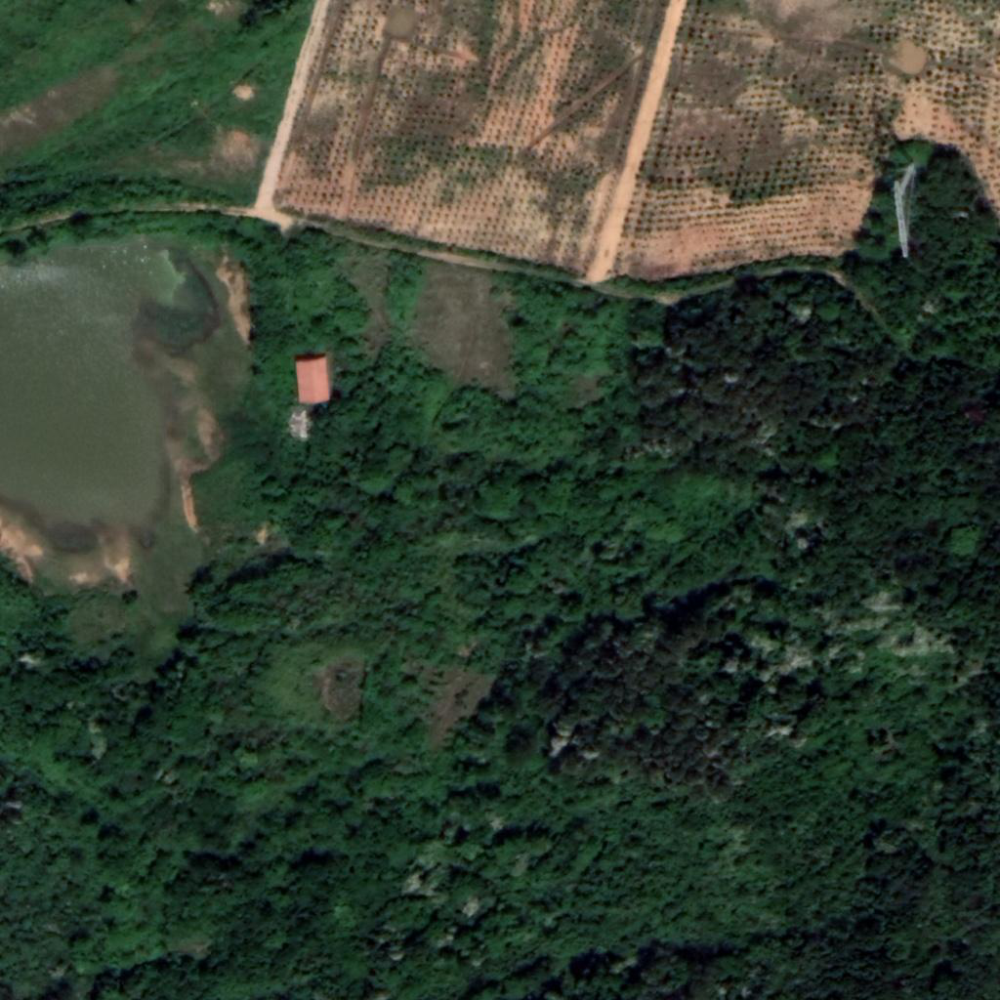

In [82]:

image = batch["original_images"][0]
Image.fromarray(image)

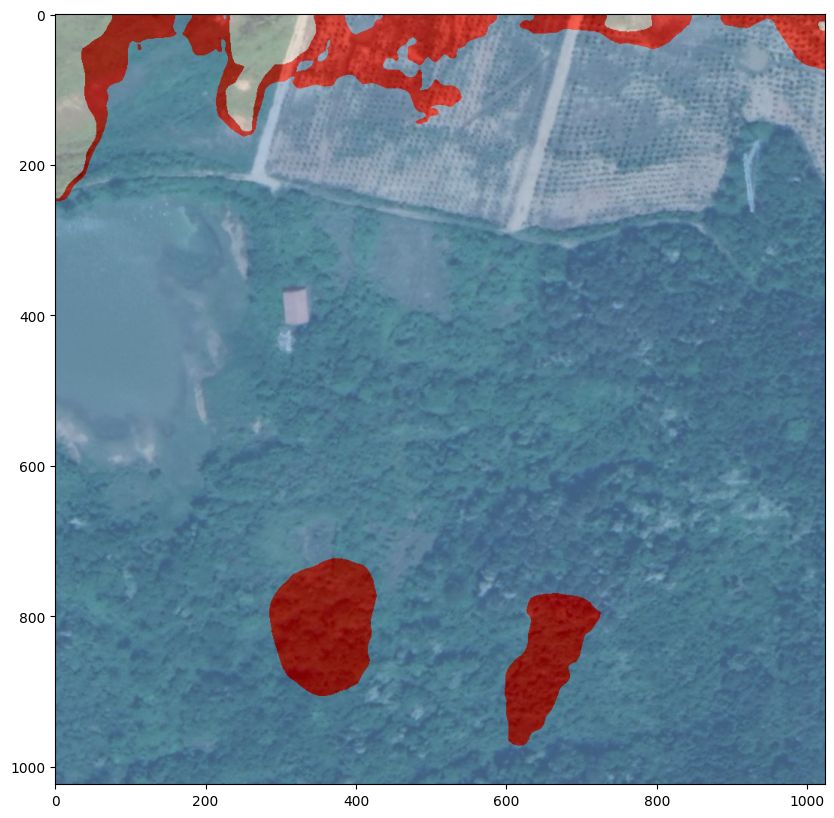

In [81]:
import numpy as np
import matplotlib.pyplot as plt

segmentation_map = predicted_segmentation_maps[0].cpu().numpy()

color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map == label, :] = color
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = image * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

In [85]:
np.unique(segmentation_map)

array([1, 4, 6, 7], dtype=uint8)

In [43]:
np.unique(segmentation_map)

array([1, 2, 3, 4, 7])

In [45]:
predicted_segmentation_maps

[tensor([[4, 4, 4,  ..., 7, 7, 7],
         [4, 4, 4,  ..., 7, 7, 7],
         [4, 4, 4,  ..., 7, 7, 7],
         ...,
         [3, 3, 3,  ..., 7, 7, 7],
         [3, 3, 3,  ..., 7, 7, 7],
         [3, 3, 3,  ..., 7, 7, 7]], device='cuda:0'),
 tensor([[6, 6, 6,  ..., 6, 6, 6],
         [6, 6, 6,  ..., 6, 6, 6],
         [6, 6, 6,  ..., 6, 6, 6],
         ...,
         [6, 6, 6,  ..., 1, 1, 1],
         [6, 6, 6,  ..., 1, 1, 1],
         [6, 6, 6,  ..., 1, 1, 1]], device='cuda:0')]

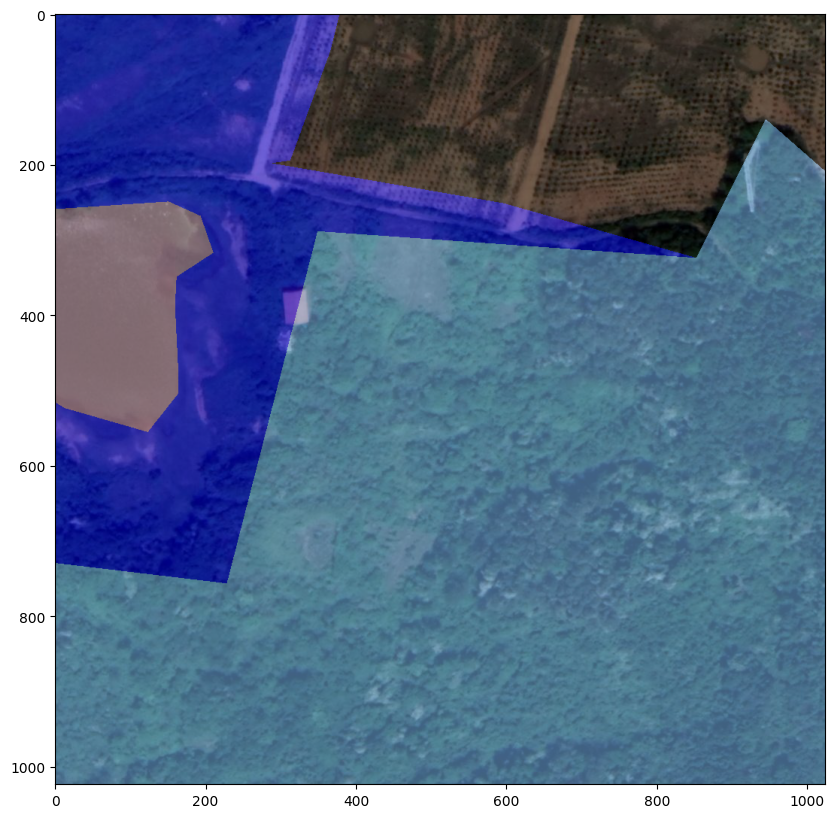

In [83]:
import numpy as np
import matplotlib.pyplot as plt

segmentation_map = batch["original_segmentation_maps"][0]

color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map == label, :] = color
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = image * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

In [100]:
segmentation_map = batch["original_segmentation_maps"][1]
segmentation_map

array([[1, 1, 1, ..., 6, 6, 6],
       [1, 1, 1, ..., 6, 6, 6],
       [1, 1, 1, ..., 6, 6, 6],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=uint8)

In [ ]:
np.unique(segmentation_map)

In [65]:
outputs = model(batch["pixel_values"],
                class_labels=batch["class_labels"],
                mask_labels=batch["mask_labels"])

RuntimeError: Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same or input should be a MKLDNN tensor and weight is a dense tensor

In [ ]:
outputs.loss


In [ ]:
!pip install -q evaluate


In [ ]:
import evaluate

metric = evaluate.load("mean_iou")

# Sidewalks

In [86]:
from transformers import Mask2FormerImageProcessor, Mask2FormerForUniversalSegmentation, AutoImageProcessor
from PIL import Image
import cv2 as cv2 
#processor = Mask2FormerImageProcessor.from_pretrained("facebook/mask2former-swin-small-cityscapes-semantic")
#model = Mask2FormerForUniversalSegmentation.from_pretrained("facebook/mask2former-swin-small-cityscapes-semantic")


CONFIG = "facebook/mask2former-swin-large-cityscapes-semantic"
processor = Mask2FormerImageProcessor.from_pretrained(CONFIG)
model = Mask2FormerForUniversalSegmentation.from_pretrained(CONFIG)

# the og id2label is just the hugging face facebook repo that has a specific id2label in the docs for what the model uses 


In [87]:
print(dir(processor))

['__call__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_auto_class', '_create_repo', '_get_files_timestamps', '_max_size', '_pad_image', '_preprocess', '_preprocess_image', '_preprocess_mask', '_processor_class', '_set_processor_class', '_upload_modified_files', 'convert_segmentation_map_to_binary_masks', 'do_normalize', 'do_rescale', 'do_resize', 'encode_inputs', 'from_dict', 'from_json_file', 'from_pretrained', 'get_image_processor_dict', 'ignore_index', 'image_mean', 'image_processor_type', 'image_std', 'max_size', 'model_input_names', 'normalize', 'num_labels', 'pad', 'post_process_instance_segmentation', 'post_process_panoptic_segmentation', 'post_process_semantic_segmentation', 'pre

In [89]:
cityscapesid2label 


{0: Label(name='unlabeled', id=0, trainId=255, category='void', categoryId=0, hasInstances=False, ignoreInEval=True, color=(0, 0, 0)),
 1: Label(name='ego vehicle', id=1, trainId=255, category='void', categoryId=0, hasInstances=False, ignoreInEval=True, color=(0, 0, 0)),
 2: Label(name='rectification border', id=2, trainId=255, category='void', categoryId=0, hasInstances=False, ignoreInEval=True, color=(0, 0, 0)),
 3: Label(name='out of roi', id=3, trainId=255, category='void', categoryId=0, hasInstances=False, ignoreInEval=True, color=(0, 0, 0)),
 4: Label(name='static', id=4, trainId=255, category='void', categoryId=0, hasInstances=False, ignoreInEval=True, color=(0, 0, 0)),
 5: Label(name='dynamic', id=5, trainId=255, category='void', categoryId=0, hasInstances=False, ignoreInEval=True, color=(111, 74, 0)),
 6: Label(name='ground', id=6, trainId=255, category='void', categoryId=0, hasInstances=False, ignoreInEval=True, color=(81, 0, 81)),
 7: Label(name='road', id=7, trainId=0, cate

In [90]:
# from transformers import AutoFeatureExtractor, MaskFormerForInstanceSegmentation

# processor = AutoFeatureExtractor.from_pretrained("nielsr/maskformer-resnet101-cityscapes")

# model = MaskFormerForInstanceSegmentation.from_pretrained("nielsr/maskformer-resnet101-cityscapes")

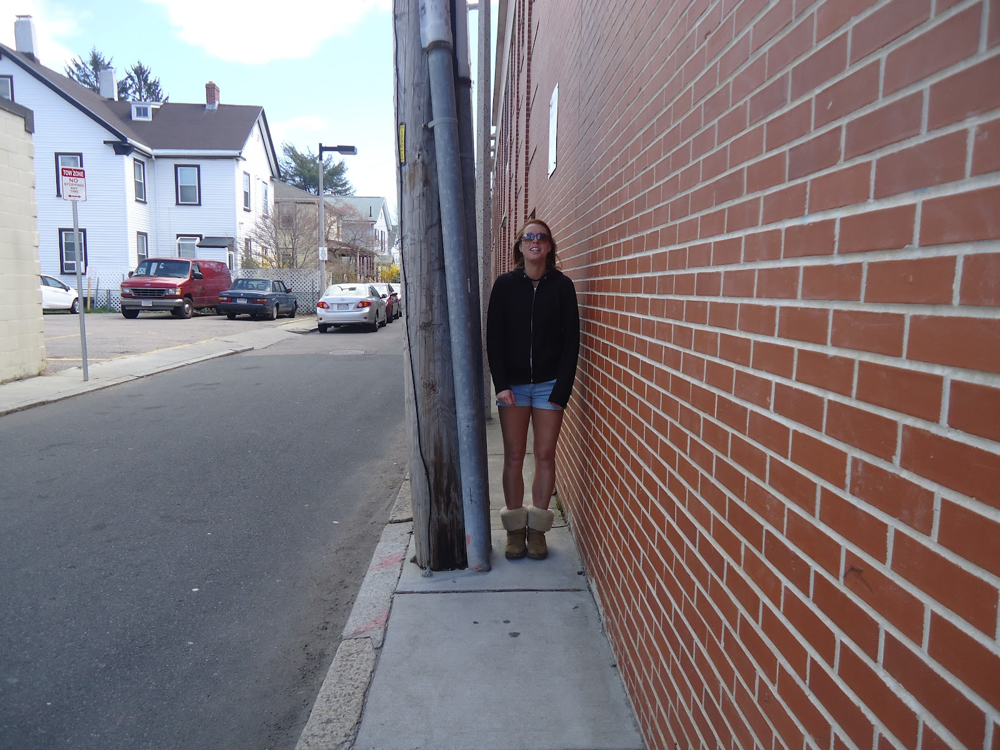

In [181]:
# image = cv2.imread("/media/data_16T/chloe/try/massave.png")
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

image = Image.open("/media/data_16T/chloe/DSC02106.jpeg").convert("RGB")
image

# image = cv2.imread("../sidewalkdata/output_0001.png")
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [182]:
# image = Image.fromarray(image)

In [183]:
import torch
import numpy as np 
import matplotlib.pyplot as plt

inputs = processor(images=image, return_tensors="pt")

with torch.no_grad():
  outputs = model(**inputs)
     

In [184]:
predicted_semantic_map = processor.post_process_semantic_segmentation(outputs, target_sizes=[image.size[::-1]])[0]
predicted_semantic_map

tensor([[2, 2, 2,  ..., 2, 2, 2],
        [2, 2, 2,  ..., 2, 2, 2],
        [2, 2, 2,  ..., 2, 2, 2],
        ...,
        [0, 0, 0,  ..., 2, 2, 2],
        [0, 0, 0,  ..., 2, 2, 2],
        [0, 0, 0,  ..., 2, 2, 2]])

In [185]:
semantic_seg_mask = predicted_semantic_map.cpu().detach().numpy()
# .detach returns a new tensor without requires_grad = True. The gradient with respect to this tensor will no longer be computed.

In [186]:
semantic_seg_mask

array([[2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       ...,
       [0, 0, 0, ..., 2, 2, 2],
       [0, 0, 0, ..., 2, 2, 2],
       [0, 0, 0, ..., 2, 2, 2]])

In [187]:
# OLD 

def visualize_instance_seg_mask(mask):
    # Initialize image with zeros with the image resolution
    # of the segmentation mask and 3 channels
    image = np.zeros((mask.shape[0], mask.shape[1], 3))
    # Create labels
    labels = np.unique(mask)
    # label2color = {
    #     label: (
    #         random.randint(0, 255),
    #         random.randint(0, 255),
    #         random.randint(0, 255),
    #     )
    #     for label in labels
    # }

    label2color = label2color_up

    
    for height in range(image.shape[0]):
        for width in range(image.shape[1]):
            image[height, width, :] = label2color[mask[height, width]]
    image = image / 255
    return image, label2color

In [188]:
id2label = {
    "0": "road",
    "1": "sidewalk",
    "2": "building",
    "3": "wall",
    "4": "fence",
    "5": "pole",
    "6": "traffic light",
    "7": "traffic sign",
    "8": "vegetation",
    "9": "terrain",
    "10": "sky",
    "11": "person",
    "12": "rider",
    "13": "car",
    "14": "truck",
    "15": "bus",
    "16": "train",
    "17": "motorcycle",
    "18": "bicycle"
}

In [189]:
label2color = {}
label2color_up = {}

for cls, label in id2label.items():
    label2color_up[cls] = label

label2color_up

{'0': 'road',
 '1': 'sidewalk',
 '2': 'building',
 '3': 'wall',
 '4': 'fence',
 '5': 'pole',
 '6': 'traffic light',
 '7': 'traffic sign',
 '8': 'vegetation',
 '9': 'terrain',
 '10': 'sky',
 '11': 'person',
 '12': 'rider',
 '13': 'car',
 '14': 'truck',
 '15': 'bus',
 '16': 'train',
 '17': 'motorcycle',
 '18': 'bicycle'}

In [190]:
from typing import Dict, Tuple

newidtocolor: Dict[int, Tuple[int, int, int]] = {
    "0": (128, 64, 128),
    "1": (244, 35, 232),
    "2": (70, 70, 70),
    "3": (102, 102, 156),
    "4": (190, 153, 153),
    "5": (153, 153, 153),
    "6": (250, 170, 30),
    "7": (220, 220, 0),
    "8":(107, 142, 35),
    "9": (152, 251, 152),
    "10": (70, 130, 180),
    "11": (220, 20, 60),
    "12": (255, 0, 0),
    "13": (0, 0, 142),
    "14": (0, 0, 70),
    "15": (0, 60, 100),
    "16": (0, 80, 100),
    "17" :(0, 0, 230), 
    "18": (119, 11, 32)
}

newidtocolor: Dict[int, Tuple[int, int, int]] = {
    int(key): value for key, value in newidtocolor.items()
}

newidtocolor

{0: (128, 64, 128),
 1: (244, 35, 232),
 2: (70, 70, 70),
 3: (102, 102, 156),
 4: (190, 153, 153),
 5: (153, 153, 153),
 6: (250, 170, 30),
 7: (220, 220, 0),
 8: (107, 142, 35),
 9: (152, 251, 152),
 10: (70, 130, 180),
 11: (220, 20, 60),
 12: (255, 0, 0),
 13: (0, 0, 142),
 14: (0, 0, 70),
 15: (0, 60, 100),
 16: (0, 80, 100),
 17: (0, 0, 230),
 18: (119, 11, 32)}

In [191]:
# newidtocolor: Dict[int, Tuple[int, int, int]] = {
#     "0": (128, 64, 128),
#     "1": (244, 35, 232),
#     "2": (70, 70, 70),
#     "3": (102, 102, 156),
#     "4": (190, 153, 153),
#     "5": (153, 153, 153),
#     "6": (250, 170, 30),
#     "7": (220, 220, 0),
#     "8":(107, 142, 35),
#     "9": (152, 251, 152),
#     "10": (70, 130, 180),
#     "11": (220, 20, 60),
#     "12": (255, 0, 0),
#     "13": (0, 0, 142),
#     "14": (0, 0, 70),
#     "15": (0, 60, 100),
#     "16": (0, 80, 100),
#     "17" :(0, 0, 230), 
#     "18": (119, 11, 32)
# }

In [192]:
# new
def visualize_instance_seg_mask(mask):
    # Initialize image with zeros with the image resolution
    # of the segmentation mask and 3 channels
    blank_image = np.zeros((mask.shape[0], mask.shape[1], 3))
    # Create labels
    labels = np.unique(mask)
    # newidtocolor = {
    #     label: (
    #         random.randint(0, 255),
    #         random.randint(0, 255),
    #         random.randint(0, 255),
    #     )
    #     for label in labels
    # }

    # label2color = newidtocolor

    for height in range(blank_image.shape[0]):
        for width in range(blank_image.shape[1]):
            blank_image[height, width, :] = newidtocolor[mask[height, width]]
    blank_image = blank_image / 255
    return blank_image



In [193]:
visualize_instance_seg_mask(semantic_seg_mask).shape

(1200, 1600, 3)

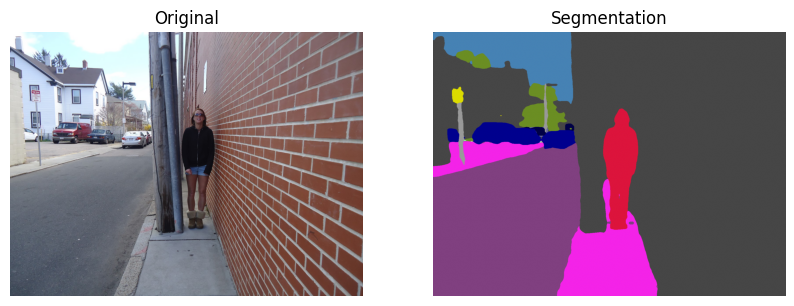

In [194]:
instance_seg_mask_disp = visualize_instance_seg_mask(semantic_seg_mask)
plt.figure(figsize=(10, 10))
for plot_index in range(2):
    if plot_index == 0: # this is the first iteration 
        plot_image = image
        title = "Original"
    else:
        plot_image = instance_seg_mask_disp
        title = "Segmentation"
    
    plt.subplot(1, 2, plot_index+1)
    plt.imshow(plot_image)
    plt.title(title)
    plt.axis("off")

In [ ]:
instance_seg_mask_disp = visualize_instance_seg_mask(semantic_seg_mask)
plt.figure(figsize=(10, 10))
for plot_index in range(2):
    if plot_index == 0: # this is the first iteration 
        plot_image = image
        title = "Original"
    else:
        plot_image = instance_seg_mask_disp
        title = "Segmentation"
    
    plt.subplot(1, 2, plot_index+1)
    plt.imshow(plot_image)
    plt.title(title)
    plt.axis("off")

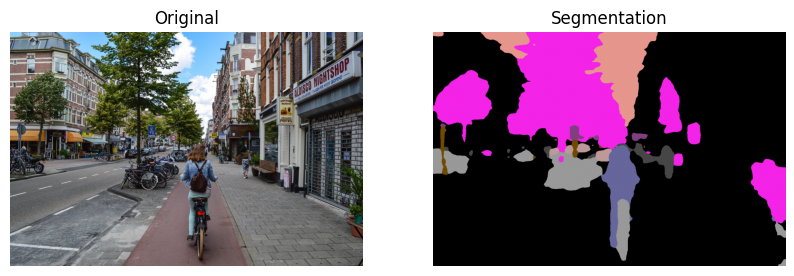

In [83]:
# instance_seg_mask_disp, label2color = visualize_instance_seg_mask(semantic_seg_mask)
# plt.figure(figsize=(10, 10))
# for plot_index in range(2):
#     if plot_index == 0:
#         plot_image = image
#         title = "Original"
#     else:
#         plot_image = instance_seg_mask_disp
#         title = "Segmentation"
    
#     plt.subplot(1, 2, plot_index+1)
#     plt.imshow(plot_image)
#     plt.title(title)
#     plt.axis("off")

In [84]:
label2color

{0: (0, 0, 0),
 1: (0, 0, 0),
 2: (0, 0, 0),
 3: (0, 0, 0),
 4: (0, 0, 0),
 5: (111, 74, 0),
 6: (81, 0, 81),
 7: (128, 64, 128),
 8: (244, 35, 232),
 9: (250, 170, 160),
 10: (230, 150, 140),
 11: (70, 70, 70),
 12: (102, 102, 156),
 13: (190, 153, 153),
 14: (180, 165, 180),
 15: (150, 100, 100),
 16: (150, 120, 90),
 17: (153, 153, 153),
 18: (153, 153, 153),
 19: (250, 170, 30),
 20: (220, 220, 0),
 21: (107, 142, 35),
 22: (152, 251, 152),
 23: (70, 130, 180),
 24: (220, 20, 60),
 25: (255, 0, 0),
 26: (0, 0, 142),
 27: (0, 0, 70),
 28: (0, 60, 100),
 29: (0, 0, 90),
 30: (0, 0, 110),
 31: (0, 80, 100),
 32: (0, 0, 230),
 33: (119, 11, 32),
 -1: (0, 0, 142)}

In [132]:
predicted_semantic_map.shape

torch.Size([1840, 3280])

In [128]:
def cityscapes_palette(): 
    return [[244,35,232]]

cityscapes_palette()


[[244, 35, 232]]

In [129]:
from torch import nn
import numpy as np
import matplotlib.pyplot as plt

seg = predicted_semantic_map

seg

tensor([[8, 8, 8,  ..., 2, 2, 2],
        [8, 8, 8,  ..., 2, 2, 2],
        [8, 8, 8,  ..., 2, 2, 2],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]])

In [130]:
palette = np.array(cityscapes_palette())
palette

array([[244,  35, 232]])

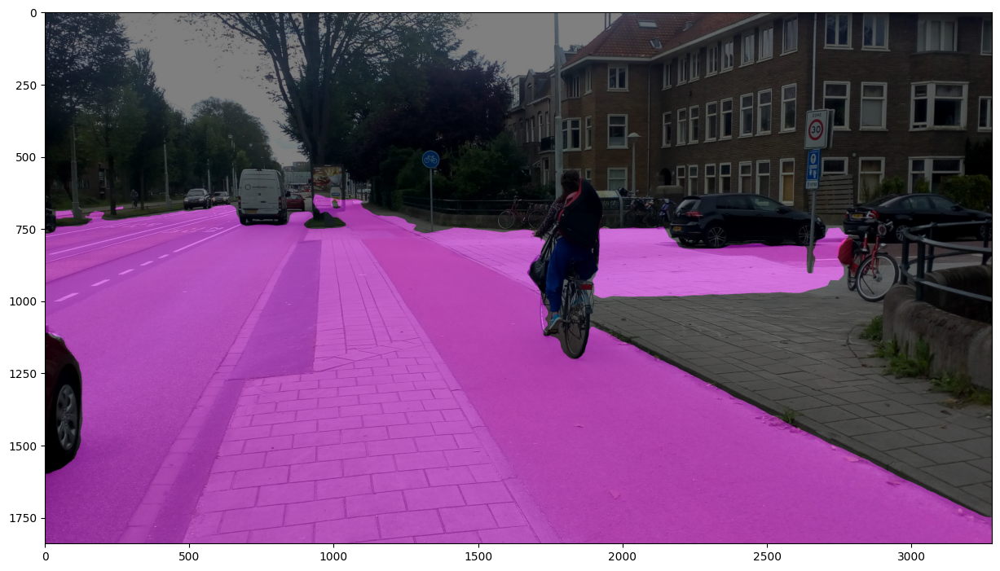

In [131]:
color_seg = np.zeros((seg.shape[0], seg.shape[1], 3), dtype=np.uint8) # height, width, 3
palette = np.array(cityscapes_palette())
for label, color in enumerate(palette):
    color_seg[seg == 0, :] = color
# Convert to BGR
color_seg = color_seg[..., ::-1]

# Show image + mask
img = np.array(image) * 0.5 + color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

In [10]:
import pickle 
print(pickle.__doc__)


Create portable serialized representations of Python objects.

See module copyreg for a mechanism for registering custom picklers.
See module pickletools source for extensive comments.

Classes:

    Pickler
    Unpickler

Functions:

    dump(object, file)
    dumps(object) -> string
    load(file) -> object
    loads(bytes) -> object

Misc variables:

    __version__
    format_version
    compatible_formats




In [118]:
device = torch.device('cuda:1' if torch.cuda.is_available() else "cpu")

In [117]:
model['model']

OrderedDict([('backbone.stem.conv1.weight',
              array([[[[ 1.30496165e-02,  1.35775236e-02, -1.60268638e-02, ...,
                        -4.08440568e-02, -4.23038378e-02, -6.94783702e-02],
                       [ 4.92647104e-03,  6.04487024e-03,  1.45992935e-02, ...,
                         1.89671409e-03, -2.02150624e-02, -3.71348709e-02],
                       [ 2.28877310e-02,  2.36502904e-02,  1.60949975e-02, ...,
                         9.99469981e-02,  6.11647591e-02,  5.12342863e-02],
                       ...,
                       [ 1.44030876e-03,  2.90139262e-02, -8.51557218e-03, ...,
                        -1.23822860e-01, -7.41148815e-02,  8.61294568e-03],
                       [ 5.01723820e-03,  4.83622774e-02,  6.17037080e-02, ...,
                         2.39072554e-02, -3.23281363e-02, -1.46889649e-02],
                       [-7.78493211e-02, -3.10034603e-02, -1.71807837e-02, ...,
                         3.40255983e-02,  2.17980258e-02,  1.7274626

In [12]:
print(dir(model))


['__class__', '__class_getitem__', '__contains__', '__delattr__', '__delitem__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__ior__', '__iter__', '__le__', '__len__', '__lt__', '__ne__', '__new__', '__or__', '__reduce__', '__reduce_ex__', '__repr__', '__reversed__', '__ror__', '__setattr__', '__setitem__', '__sizeof__', '__str__', '__subclasshook__', 'clear', 'copy', 'fromkeys', 'get', 'items', 'keys', 'pop', 'popitem', 'setdefault', 'update', 'values']


In [122]:
from transformers import Mask2FormerConfig, Mask2FormerModel

# Initializing a Mask2Former facebook/mask2former-swin-small-coco-instance configuration
configuration = Mask2FormerConfig()

# Initializing a model (with random weights) from the facebook/mask2former-swin-small-coco-instance style configuration
model = Mask2FormerModel(configuration)

# Accessing the model configuration
configuration = model.config
configuration
model

Mask2FormerModel(
  (pixel_level_module): Mask2FormerPixelLevelModule(
    (encoder): SwinBackbone(
      (embeddings): SwinEmbeddings(
        (patch_embeddings): SwinPatchEmbeddings(
          (projection): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
        )
        (norm): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
        (dropout): Dropout(p=0.0, inplace=False)
      )
      (encoder): SwinEncoder(
        (layers): ModuleList(
          (0): SwinStage(
            (blocks): ModuleList(
              (0-1): 2 x SwinLayer(
                (layernorm_before): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
                (attention): SwinAttention(
                  (self): SwinSelfAttention(
                    (query): Linear(in_features=96, out_features=96, bias=True)
                    (key): Linear(in_features=96, out_features=96, bias=True)
                    (value): Linear(in_features=96, out_features=96, bias=True)
                    (dropout): Dro